In [13]:
!pip install geopandas

     |████████████████████████████████| 1.0MB 17.3MB/s 
     |████████████████████████████████| 15.3MB 317kB/s 
     |████████████████████████████████| 6.5MB 44.2MB/s 


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

import geopandas as gpd
from branca.colormap import LinearColormap

import missingno as msno
from pandas_profiling import ProfileReport
import numpy as np

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn import metrics
from sklearn.model_selection import cross_val_score

In [2]:
listings = pd.read_csv('listings.csv', index_col='id')
listings_detailed = pd.read_csv('listings-2.csv', index_col='id')
# reviews = pd.read_csv('reviews.csv')
# calendar = pd.read_csv('calendar.csv')

In [ ]:
listings.head()

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
id,,,,,,,,,,,,,,,
109,Amazing bright elegant condo park front *UPGRA...,521,Paolo,Other Cities,Culver City,33.98209,-118.38494,Entire home/apt,115,30,2,2016-05-15,0.02,1,0
2708,Runyon Canyon | Beau Furn Mir Mini-Suite Fire...,3008,Chas.,City of Los Angeles,Hollywood,34.09768,-118.34602,Private room,71,30,28,2020-11-08,0.34,2,315
2732,Zen Life at the Beach,3041,Yoga Priestess,Other Cities,Santa Monica,34.00475,-118.48127,Private room,155,1,21,2019-12-27,0.18,2,365
2864,* Beautiful Master Suite/Jacuzzi Tub/*,3207,Bernadine,Other Cities,Bellflower,33.87619,-118.11397,Entire home/apt,50,30,0,NaN,NaN,1,0
5728,Tiny Home in Artistic Oasis near Venice and LAX,9171,Sanni,City of Los Angeles,Del Rey,33.98750,-118.43200,Private room,42,30,310,2020-04-29,2.20,4,1


In [ ]:
listings.shape

(31900, 15)

In [ ]:
# Checking the columns in listings
listings.columns

Index(['name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood',
       'latitude', 'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [ ]:
listings_detailed.shape

(31900, 73)

In [ ]:
listings_detailed.columns

Index(['listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_updated',

In [3]:
# The detailed listings contains more columns that can be useful for the EDA. I am adding some columns from detailed
# listings to listings data set

additional_columns = ["property_type", "accommodates", "first_review", "review_scores_value", "review_scores_cleanliness",
                      "review_scores_location", "review_scores_accuracy", "review_scores_communication", "review_scores_checkin",
                      "review_scores_rating", "maximum_nights", "listing_url", "host_is_superhost", "host_about", "host_response_time", 
                      "host_response_rate", "calendar_updated", "reviews_per_month"]

listings = pd.merge(listings, listings_detailed[additional_columns], on="id", how='left')

In [4]:
listings.shape

(31900, 33)

In [5]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31900 entries, 109 to 48072320
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            31899 non-null  object 
 1   host_id                         31900 non-null  int64  
 2   host_name                       31865 non-null  object 
 3   neighbourhood_group             31900 non-null  object 
 4   neighbourhood                   31900 non-null  object 
 5   latitude                        31900 non-null  float64
 6   longitude                       31900 non-null  float64
 7   room_type                       31900 non-null  object 
 8   price                           31900 non-null  int64  
 9   minimum_nights                  31900 non-null  int64  
 10  number_of_reviews               31900 non-null  int64  
 11  last_review                     24219 non-null  object 
 12  reviews_per_month_x        

In [6]:
# As we can see from the above information calender_upadted column is not useful as it contains
# 0 non null values. Removing this column from the listings
listings.drop(columns=['calendar_updated'], inplace= True)

In [7]:
listings.head()

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month_x,calculated_host_listings_count,availability_365,property_type,accommodates,first_review,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,listing_url,host_is_superhost,host_about,host_response_time,host_response_rate,reviews_per_month_y
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
109,Amazing bright elegant condo park front *UPGRA...,521,Paolo,Other Cities,Culver City,33.98209,-118.38494,Entire home/apt,115,30,2,2016-05-15,0.02,1,0,Entire condominium,6,2011-08-15,8.0,10.0,10.0,10.0,8.0,6.0,80.0,730,https://www.airbnb.com/rooms/109,f,"Paolo Privitera, CEO Evensi\n\nPaolo, MIT MBA ...",within a day,100%,0.02
2708,Runyon Canyon | Beau Furn Mir Mini-Suite Fire...,3008,Chas.,City of Los Angeles,Hollywood,34.09768,-118.34602,Private room,71,30,28,2020-11-08,0.34,2,315,Private room in apartment,1,2014-06-09,10.0,10.0,10.0,10.0,10.0,10.0,97.0,366,https://www.airbnb.com/rooms/2708,t,Writer.\r\nLiterary Manager.\r\nPhotographer.\...,within an hour,100%,0.34
2732,Zen Life at the Beach,3041,Yoga Priestess,Other Cities,Santa Monica,34.00475,-118.48127,Private room,155,1,21,2019-12-27,0.18,2,365,Private room in apartment,1,2011-06-06,9.0,9.0,10.0,9.0,9.0,9.0,94.0,180,https://www.airbnb.com/rooms/2732,f,I have been teaching yoga and meditation for 3...,within a few hours,80%,0.18
2864,* Beautiful Master Suite/Jacuzzi Tub/*,3207,Bernadine,Other Cities,Bellflower,33.87619,-118.11397,Entire home/apt,50,30,0,NaN,NaN,1,0,Entire apartment,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,730,https://www.airbnb.com/rooms/2864,f,"Fair, open, honest and very informative for ne...",NaN,NaN,NaN
5728,Tiny Home in Artistic Oasis near Venice and LAX,9171,Sanni,City of Los Angeles,Del Rey,33.98750,-118.43200,Private room,42,30,310,2020-04-29,2.20,4,1,Private room in tiny house,2,2009-07-17,9.0,10.0,10.0,10.0,10.0,10.0,96.0,1125,https://www.airbnb.com/rooms/5728,t,we are loving our home and would like to share...,within a few hours,100%,2.20


In [8]:
listings_losangeles = listings.copy()
listings_losangeles.to_csv('listings_losangeles.csv')

**2. Data Exploration**

2.1.   Neighbourhoods



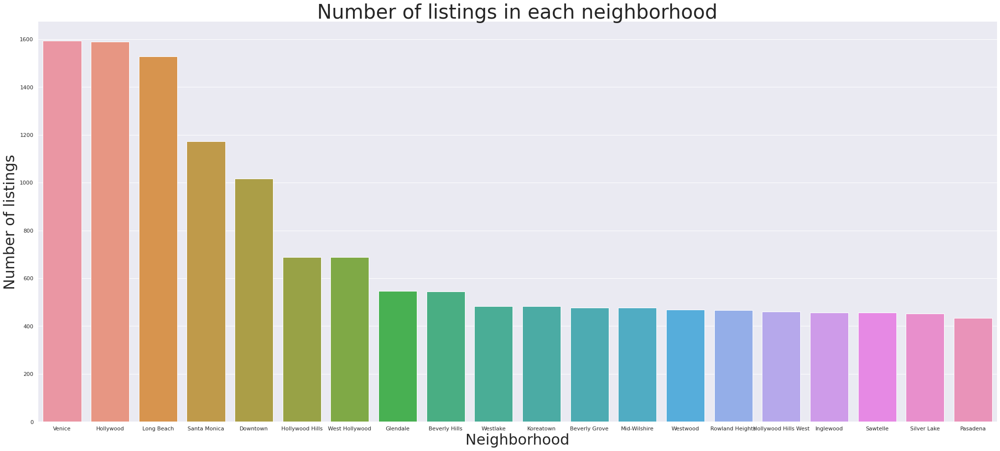

In [ ]:
plt.figure(figsize=(35,15))
sns.countplot(data=listings, x='neighbourhood', order=listings.neighbourhood.value_counts().nlargest(20).index)
plt.title('Number of listings in each neighborhood', fontsize=40)
plt.ylabel('Number of listings', fontsize=30)
plt.xlabel('Neighborhood', fontsize=30)
sns.despine(bottom = True, left = True)
plt.show()

In [19]:
#to make the interactive maps
import folium
from folium.plugins import FastMarkerCluster
from branca.colormap import LinearColormap

In [ ]:
lats = listings['latitude'].tolist()
lons = listings['longitude'].tolist()
locations = list(zip(lats, lons))

map = folium.Map(location=[34.0522, -118.243683])
FastMarkerCluster(data=locations).add_to(map)
map

In [9]:
# we will see how the prices are listed in the main neighbourhoods which have more listings
top_10_neighbourhoods = ['Venice', 'Hollywood', 'Long Beach', 'Santa Monica', 'Downtown', 'Hollywood Hills', 'West Hollywood',
                         'Glendale', 'Beverly Hills', 'Westlake']
top_10_neighbourhoods_data = listings[listings.neighbourhood.isin(top_10_neighbourhoods)]


In [10]:
top_10_neighbourhoods_data.shape

(9849, 32)

In [ ]:
# #we can see from our statistical table that we have some extreme values, therefore we need to remove them for the sake of a better visualization

# #using violinplot to showcase density and distribtuion of prices
# top_neighbourhoods_data = top_neighbourhoods_data[]
# plt.figure(figsize=(20,10))
# violin_plot=sns.violinplot(data=top_neighbourhoods_data, x='neighbourhood', y='price')
# plt.title('Density and distribution of prices for top 5 neighbourhoods', fontsize=30)
# plt.ylabel('Number of listings', fontsize=25)
# plt.xlabel('Neighborhood', fontsize=25)
# sns.despine(bottom = True, left = True)
# plt.show()

2.2 Room types and Property types


2.2.1 Room Types

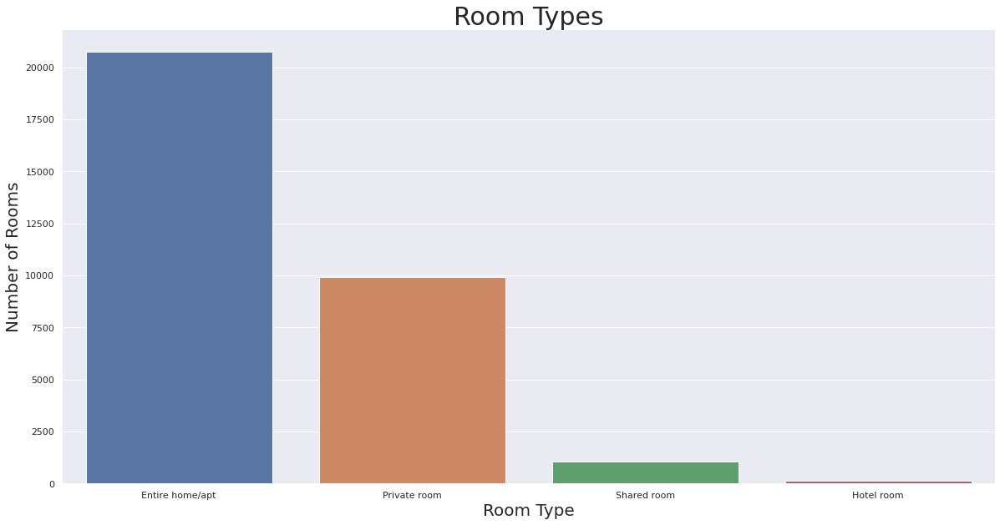

In [ ]:
plt.figure(figsize=(20,10))
sns.countplot(data=listings, x='room_type', order=listings.room_type.value_counts().index)
plt.title('Room Types', fontsize=30)
plt.ylabel('Number of Rooms', fontsize=20)
plt.xlabel('Room Type', fontsize=20)
sns.despine(bottom = True, left = True)
plt.show()

In [ ]:
# Property types
listings.property_type.unique()

array(['Entire condominium', 'Private room in apartment',
       'Entire apartment', 'Private room in tiny house',
       'Private room in guesthouse', 'Entire house',
       'Private room in house', 'Entire guesthouse',
       'Private room in loft', 'Room in hotel', 'Entire guest suite',
       'Entire bungalow', 'Private room in townhouse',
       'Private room in island', 'Entire townhouse',
       'Private room in hostel', 'Room in boutique hotel',
       'Private room in bungalow', 'Shared room in apartment',
       'Entire villa', 'Entire cottage', 'Entire cabin',
       'Private room in villa', 'Private room in guest suite',
       'Private room in farm stay', 'Shared room in house',
       'Shared room in hostel', 'Shared room in villa', 'Camper/RV',
       'Farm stay', 'Entire loft', 'Private room in condominium',
       'Entire place', 'Room in aparthotel', 'Private room in treehouse',
       'Treehouse', 'Private room', 'Private room in castle',
       'Private room in bed 

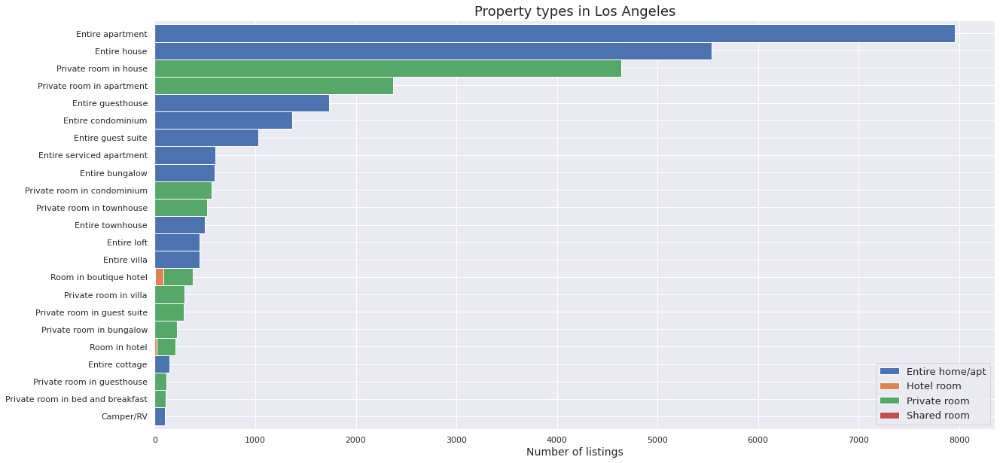

In [ ]:
# As we can see there are huge number of property types. We will display property types with at least 100 listings
property = listings.groupby(['property_type','room_type']).room_type.count()
property = property.unstack()
property['total'] = property.iloc[:,0:3].sum(axis = 1)
property = property.sort_values(by=['total'])
property = property[property['total']>=100]
property = property.drop(columns=['total'])


property.plot(kind='barh',stacked=True,
              linewidth = 1, figsize=(20,10), width=1)
plt.title('Property types in Los Angeles', fontsize=18)
plt.xlabel('Number of listings', fontsize=14)
plt.ylabel("")
plt.legend(loc = 4,prop = {"size" : 13})
plt.rc('ytick', labelsize=13)
plt.show()

<Figure size 1440x1080 with 0 Axes>

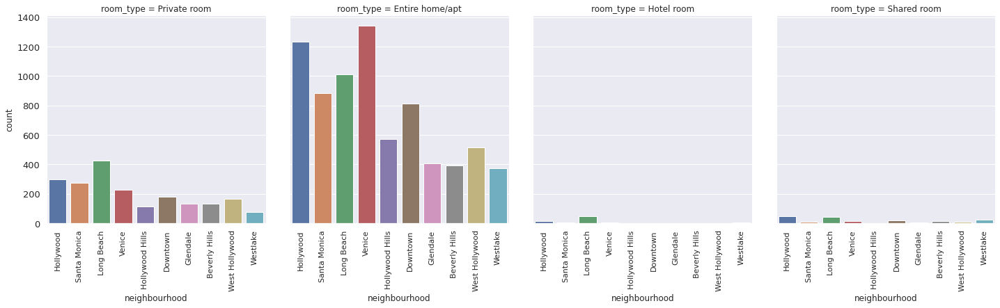

In [ ]:
#let's now combine this with our neighbourhoods and room type for a rich visualization we can make

#grabbing top 10 neighbourhoods for sub-dataframe
temp=listings.loc[listings['neighbourhood'].isin(top_10_neighbourhoods)]
#using catplot to represent multiple interesting attributes together and a count
plt.figure(figsize=(20,15))
catplot=sns.catplot(x='neighbourhood', col='room_type', data=temp, kind='count')
catplot.set_xticklabels(rotation=90)
plt.show()

2.3 Accommodates

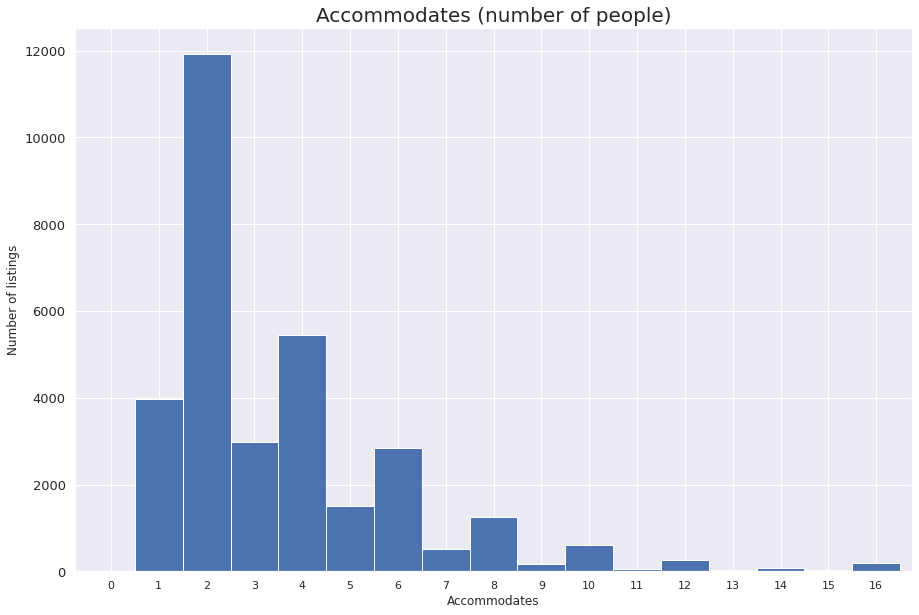

In [ ]:
accomodates=listings['accommodates'].value_counts().sort_index()
accomodates.plot.bar(figsize=(15, 10), color='b', width=1, rot=0)
plt.title("Accommodates (number of people)", fontsize=20)
plt.ylabel('Number of listings', fontsize=12)
plt.xlabel('Accommodates', fontsize=12)
plt.show()

3. Advice to the tourists

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


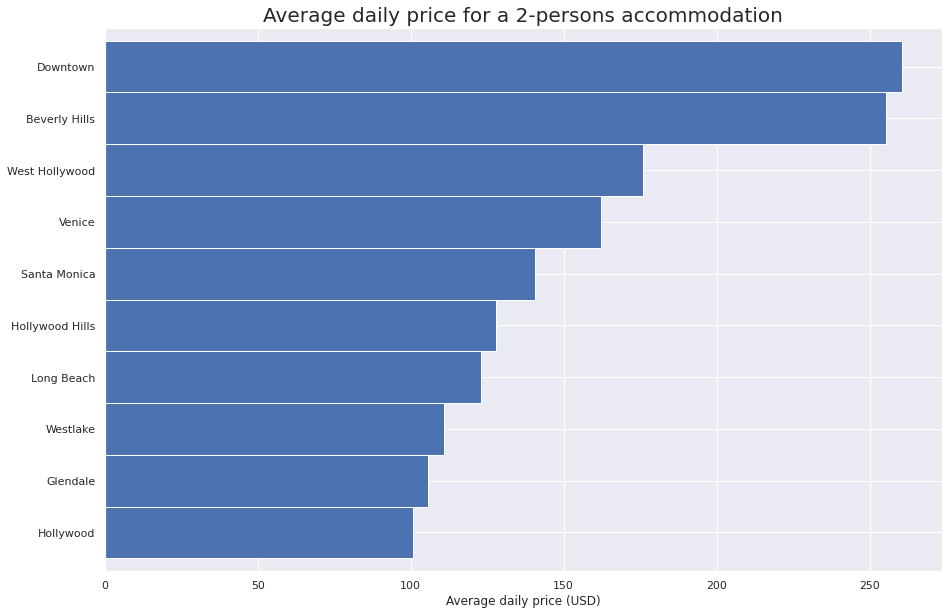

In [21]:
# We will recommend some neighbourhoods to the tourists based on price
feq = listings[listings.neighbourhood.isin(top_10_neighbourhoods)]
feq = feq[listings['accommodates']==2]
feq = feq.groupby('neighbourhood')['price'].mean().sort_values(ascending=True)
feq.plot.barh(figsize=(15, 10), color='b', width=1)
plt.title("Average daily price for a 2-persons accommodation", fontsize=20)
plt.xlabel('Average daily price (USD)', fontsize=12)
plt.ylabel("")
plt.show()

In [22]:
adam = gpd.read_file("neighbourhoods.geojson")
adam = adam[adam.neighbourhood.isin(top_10_neighbourhoods)]
feq = pd.DataFrame([feq])
feq = feq.transpose()
adam = pd.merge(adam, feq, on='neighbourhood', how='left')
adam.rename(columns={'price': 'average_price'}, inplace=True)
adam.average_price = adam.average_price.round(decimals=0)

map_dict = adam.set_index('neighbourhood')['average_price'].to_dict()
color_scale = LinearColormap(['yellow','red'], vmin = min(map_dict.values()), vmax = max(map_dict.values()))

def get_color(feature):
    value = map_dict.get(feature['properties']['neighbourhood'])
    return color_scale(value)

map3 = folium.Map(location=[34.0522, -118.243683], zoom_start=11)
folium.GeoJson(data=adam,
               name='Amsterdam',
               tooltip=folium.features.GeoJsonTooltip(fields=['neighbourhood', 'average_price'],
                                                      labels=True,
                                                      sticky=False),
               style_function= lambda feature: {
                  'fillColor': get_color(feature),
                   'color': 'black',
                   'weight': 1,
                   'dashArray': '5, 5',
                   'fillOpacity':0.5
                   },
               highlight_function=lambda feature: {'weight':3,
                                                  'fillColor': get_color(feature), 
                                                   'fillOpacity': 0.8}).add_to(map3)
map3

4. Review Scores 

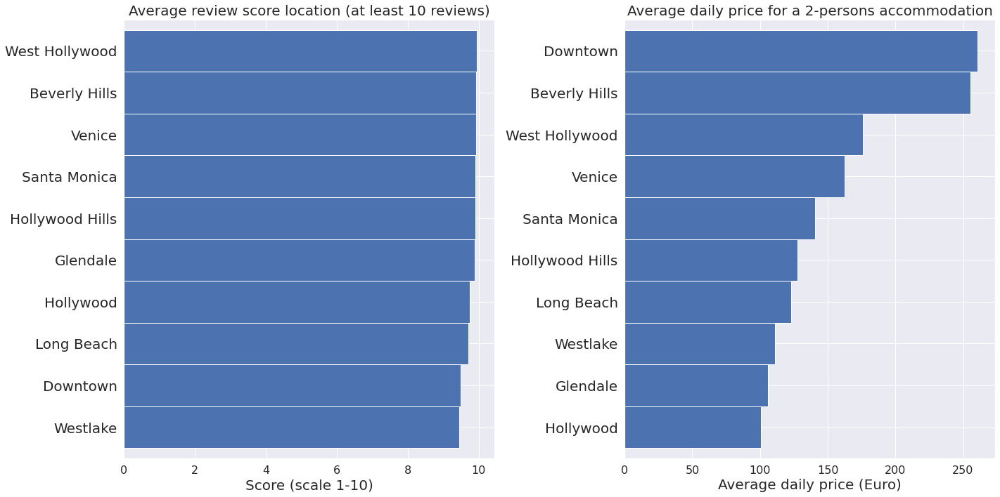

In [23]:
fig = plt.figure(figsize=(20,10))
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=20)

ax1 = fig.add_subplot(121)
feq = listings[listings['number_of_reviews']>=10]
feq = feq[feq.neighbourhood.isin(top_10_neighbourhoods)]
feq1 = feq.groupby('neighbourhood')['review_scores_location'].mean().sort_values(ascending=True)
ax1=feq1.plot.barh(color='b', width=1)
plt.title("Average review score location (at least 10 reviews)", fontsize=20)
plt.xlabel('Score (scale 1-10)', fontsize=20)
plt.ylabel("")

ax2 = fig.add_subplot(122)
feq = listings[listings['accommodates']==2]
feq = feq[feq.neighbourhood.isin(top_10_neighbourhoods)]
feq2 = feq.groupby('neighbourhood')['price'].mean().sort_values(ascending=True)
ax2=feq2.plot.barh(color='b', width=1)
plt.title("Average daily price for a 2-persons accommodation", fontsize=20)
plt.xlabel('Average daily price (Euro)', fontsize=20)
plt.ylabel("")

plt.tight_layout()
plt.show()

5. Finding a good host

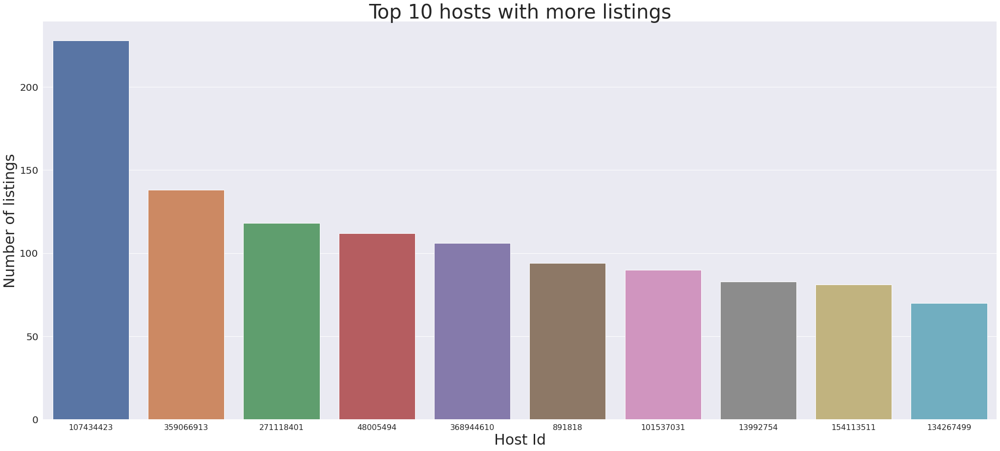

In [24]:
# Checking the hosts with most number of listings

plt.figure(figsize=(35,15))
hosts_listing_plot=sns.countplot(data=listings, x='host_id', order=listings.host_id.value_counts().nlargest(10).index)
plt.title('Top 10 hosts with more listings', fontsize=40)
plt.ylabel('Number of listings', fontsize=30)
plt.xlabel('Host Id', fontsize=30)
sns.despine(bottom = True, left = True)
plt.show()


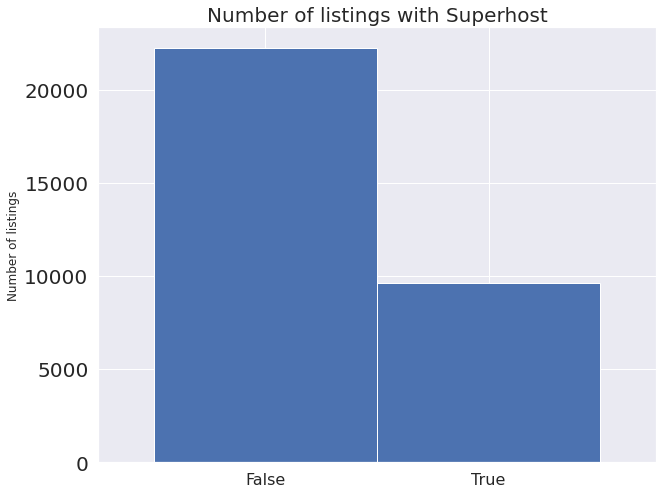

In [25]:
# Plot that shows superhost
listings.host_is_superhost = listings.host_is_superhost.replace({"t": "True", "f": "False"})

data=listings['host_is_superhost'].value_counts()
data.plot.bar(figsize=(10, 8), width=1, rot=0)
plt.title("Number of listings with Superhost", fontsize=20)
plt.ylabel('Number of listings', fontsize=12)
plt.show()

**6. Regression analysis to find which factors impact the price mostly**

6.1 Loading Data and pandas profiling

In [3]:
listings = pd.read_csv('listings.csv')

In [4]:
listings.shape

(31900, 16)

In [5]:
listings.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,3.190000e+04,3.190000e+04,31900.000000,31900.000000,31900.000000,31900.000000,31900.000000,24219.000000,31900.000000,31900.000000
mean,2.830624e+07,1.085278e+08,34.046506,-118.318454,221.941787,18.963448,33.537555,1.344370,9.782445,173.333354
std,1.455240e+07,1.117538e+08,0.133958,0.166482,596.518883,32.383104,65.172255,1.600823,26.471126,144.259092
min,1.090000e+02,5.210000e+02,33.338650,-118.934830,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.647765e+07,1.625352e+07,33.996188,-118.422973,70.000000,2.000000,1.000000,0.220000,1.000000,7.000000
50%,2.982978e+07,6.298470e+07,34.059365,-118.343930,110.000000,30.000000,6.000000,0.740000,2.000000,161.000000
75%,4.199242e+07,1.751283e+08,34.103383,-118.251797,189.000000,30.000000,35.000000,1.950000,5.000000,337.000000
max,4.807232e+07,3.875688e+08,34.811130,-117.654420,21053.000000,1125.000000,862.000000,32.360000,228.000000,365.000000


In [6]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31900 entries, 0 to 31899
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              31900 non-null  int64  
 1   name                            31899 non-null  object 
 2   host_id                         31900 non-null  int64  
 3   host_name                       31865 non-null  object 
 4   neighbourhood_group             31900 non-null  object 
 5   neighbourhood                   31900 non-null  object 
 6   latitude                        31900 non-null  float64
 7   longitude                       31900 non-null  float64
 8   room_type                       31900 non-null  object 
 9   price                           31900 non-null  int64  
 10  minimum_nights                  31900 non-null  int64  
 11  number_of_reviews               31900 non-null  int64  
 12  last_review                     

In [7]:
# Generating the report
profile = ProfileReport(listings, title='Airbnb Los Angeles listings feature description', explorative = True)

In [8]:
profile

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

6.2 Checking the feature distribution

In [ ]:
# Finding numerical and categorical features in the diamonds data
numeric_features = listings.select_dtypes(include=[np.number])
numeric_features.columns

Index(['id', 'host_id', 'latitude', 'longitude', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [ ]:
categorical_features = listings.select_dtypes(include=[np.object])
categorical_features.columns

Index(['name', 'host_name', 'neighbourhood_group', 'neighbourhood',
       'room_type', 'last_review'],
      dtype='object')

In [ ]:
# Checking the skewness of the features
listings.skew()

id                                -0.325125
host_id                            0.989333
latitude                          -0.303618
longitude                          0.687376
price                             12.960988
minimum_nights                    17.412780
number_of_reviews                  3.616410
reviews_per_month                  2.472161
calculated_host_listings_count     5.503289
availability_365                   0.113180
dtype: float64

In [ ]:
# Checking if diamonds price is normally distributed or not
plt.figure(figsize=(10,10))
sns.distplot(listings['price'], norm_hist=True)
plt.title("Price Distribution Plot",size=15, weight='bold')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Price Distribution Plot')

In [ ]:
# Log Transforming the price variable
listings['price_log'] = np.log(listings.price+1)

In [ ]:
plt.figure(figsize=(12,10))
sns.distplot(listings['price_log'], norm_hist=True)
plt.title("Log-Price Distribution Plot",size=15, weight='bold')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Log-Price Distribution Plot')

In [ ]:
# Correlation matrix
plt.figure(figsize=(15,12))
palette = sns.diverging_palette(20, 220, n=256)
corr=listings.corr(method='pearson')
sns.heatmap(corr, annot=True, fmt=".2f", cmap=palette, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}).set(ylim=(11, 0))
plt.title("Correlation Matrix",size=15, weight='bold')

Text(0.5, 1.0, 'Correlation Matrix')

In [ ]:
numeric_features.columns

Index(['id', 'host_id', 'latitude', 'longitude', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
/usr/local/lib/python3.7/dist-packages/numpy/core/function_base.py:144: RuntimeWarning: invalid value encountered in multiply
  y *= step
/usr/local/lib/python3.7/dist-packages/numpy/core/function_base.py:154: RuntimeWarning: invalid value encountered in add
  y += start
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpol

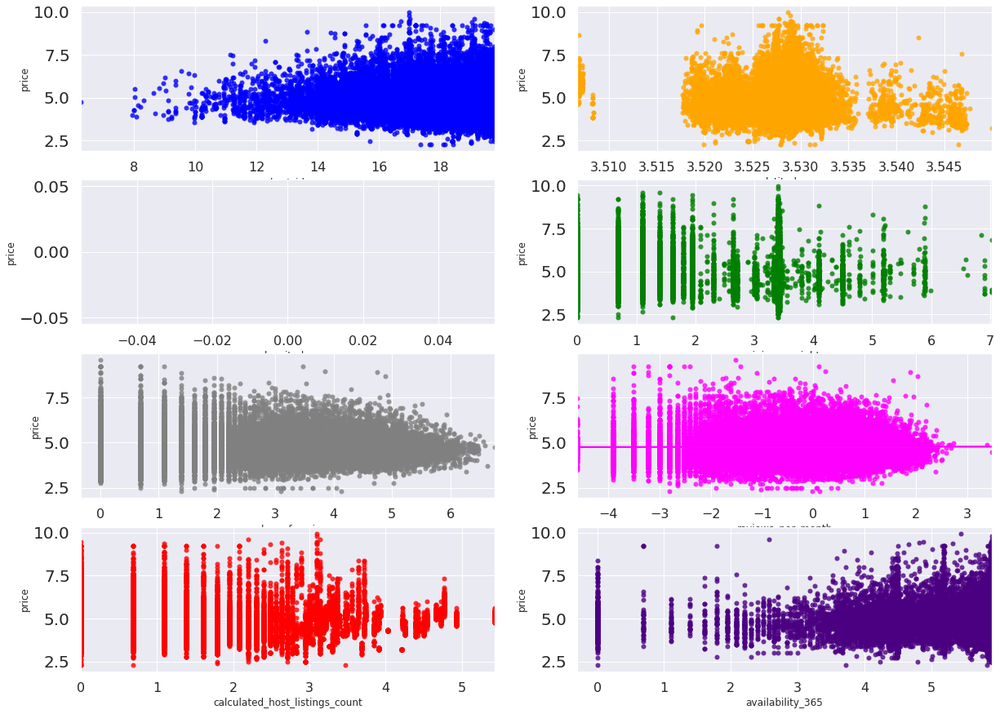

In [ ]:
# We can check this more clearly by using residual plots
# Before plotting we will convert numerical features into their respective log normal values

fig, ((ax1,ax2),(ax3,ax4),(ax5,ax6), (ax7,ax8)) = plt.subplots(nrows=4, ncols=2, figsize=(20,15))
host_id_price_plot_data = listings[['price', 'host_id']]
sns.regplot(x='host_id',y='price',data=host_id_price_plot_data.apply(np.log), scatter=True, fit_reg=True, ax=ax1, color='blue')
latitude_price_plot_data = listings[['price', 'latitude']]
sns.regplot(x='latitude',y='price',data=latitude_price_plot_data.apply(np.log), scatter=True, fit_reg=True, ax=ax2, color='orange')
longitude_price_plot_data = listings[['price', 'longitude']]
sns.regplot(x='longitude',y='price',data=longitude_price_plot_data.apply(np.log), scatter=True, fit_reg=True, ax=ax3, color='red')
minimum_nights_price_plot_data = listings[['price', 'minimum_nights']]
sns.regplot(x='minimum_nights',y='price',data=minimum_nights_price_plot_data.apply(np.log), scatter=True, fit_reg=True, ax=ax4, color='green')
number_of_reviews_price_plot_data = listings[['price', 'number_of_reviews']]
sns.regplot(x='number_of_reviews',y='price',data=number_of_reviews_price_plot_data.apply(np.log), scatter=True, fit_reg=True, ax=ax5, color='grey')
reviews_per_month_price_plot_data = listings[['price', 'reviews_per_month']]
sns.regplot(x='reviews_per_month',y='price',data=reviews_per_month_price_plot_data.apply(np.log), scatter=True, fit_reg=True, ax=ax6, color='magenta')
calculated_host_listings_count_price_plot_data = listings[['price', 'calculated_host_listings_count']]
sns.regplot(x='calculated_host_listings_count',y='price',data=calculated_host_listings_count_price_plot_data.apply(np.log), scatter=True, fit_reg=True, ax=ax7, color='red')
availability_365_price_plot_data = listings[['price', 'availability_365']]
sns.regplot(x='availability_365',y='price',data=availability_365_price_plot_data.apply(np.log), scatter=True, fit_reg=True, ax=ax8, color='indigo')

6.3 Feature Selection




In [ ]:
# Now it is time to remove unwanted features
df = listings.drop(columns=['name','id' ,'host_id','host_name', 
                                   'last_review','price'])
df.isnull().sum()

neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
minimum_nights                       0
number_of_reviews                    0
reviews_per_month                 7681
calculated_host_listings_count       0
availability_365                     0
price_log                            0
dtype: int64

In [ ]:
#reviews_per_month has missing values
#replace missing values with mean
mean = df['reviews_per_month'].mean()
df['reviews_per_month'].fillna(mean, inplace=True)
df.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
price_log                         0
dtype: int64

In [ ]:
## Label encoding for categorical variables
le = LabelEncoder()
le.fit(df['neighbourhood_group'])
df['neighbourhood_group'] = le.transform(df['neighbourhood_group'])
le.fit(df['neighbourhood'])
df['neighbourhood'] = le.transform(df['neighbourhood'])
le.fit(df['room_type'])
df['room_type'] = le.transform(df['room_type'])

In [ ]:
df

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_log
0,1,52,33.98209,-118.38494,0,30,2,0.02000,1,0,4.753590
1,0,101,34.09768,-118.34602,2,30,28,0.34000,2,315,4.276666
2,1,192,34.00475,-118.48127,2,1,21,0.18000,2,365,5.049856
3,1,22,33.87619,-118.11397,0,30,0,1.34437,1,0,3.931826
4,0,55,33.98750,-118.43200,2,30,310,2.20000,4,1,3.761200
...,...,...,...,...,...,...,...,...,...,...,...
31895,2,184,33.98763,-117.88529,2,1,0,1.34437,3,180,3.610918
31896,2,184,33.98740,-117.88588,2,1,0,1.34437,3,179,3.367296
31897,0,255,34.06114,-118.44367,0,1,0,1.34437,13,270,5.176150
31898,1,83,34.15155,-117.87664,0,1,0,1.34437,5,362,5.278115


In [ ]:
X = df.drop(columns=['price_log'], axis=1)
y = df['price_log']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)

In [ ]:
model = linear_model.LinearRegression()
model.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
def get_cv_scores(model):
    scores = cross_val_score(model,
                             X_train,
                             y_train,
                             cv=5,
                             scoring='r2')
    
    print('Mean R2 score: ', np.mean(scores))
    print('Standard Deviation: ', np.std(scores))
    print('\n')

In [ ]:
get_cv_scores(model)

Mean R2 score:  0.33943492466949376
Standard Deviation:  0.006852742063857164




In [ ]:
# Prediction
y_pred = model.predict(X_test)

In [ ]:
price_df = pd.DataFrame({'Actual Price': y_test, 'Predicted Price': y_pred})
price_df

,Actual Price,Predicted Price
25737,5.598422,5.082216
7579,4.867534,5.299397
27851,5.961005,5.970667
5148,4.234107,4.384046
29922,5.476464,5.245327
...,...,...
4653,4.605170,5.052203
185,4.532599,4.176493
14012,4.615121,5.117996
4490,4.574711,5.011922


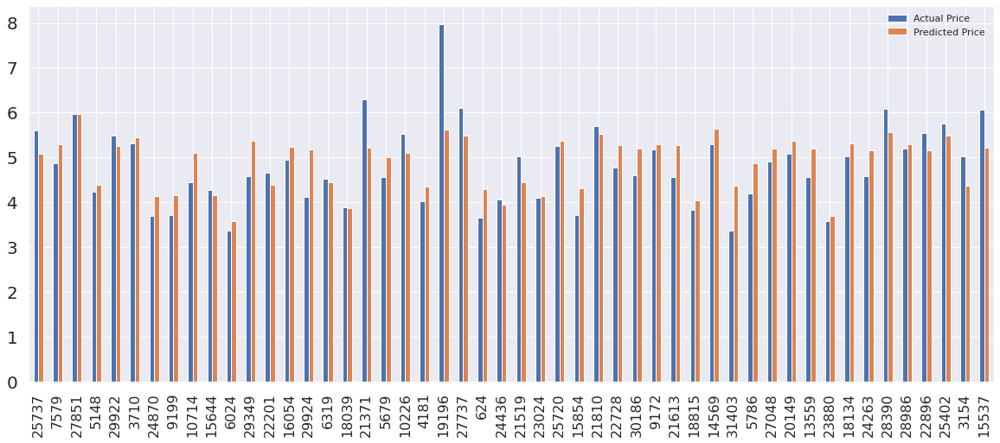

In [ ]:
# Visualizing results of Linear regression
data = price_df.head(50)
data.plot(kind='bar',figsize=(20,8))
# plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
# plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
# plt.show()

In [ ]:
data

,Actual Price,Predicted Price
25737,5.598422,5.082216
7579,4.867534,5.299397
27851,5.961005,5.970667
5148,4.234107,4.384046
29922,5.476464,5.245327
3710,5.303305,5.448351
24870,3.688879,4.142622
9199,3.713572,4.164453
10714,4.454347,5.098331
15644,4.262680,4.159102
